In [1]:
import zipfile
import os

# Path to the uploaded zip file
zip_file_path = "/content/all_images_final.zip"  # Replace with your zip file name

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall("/content/all_images_final")

# Verify the extracted content
extracted_folder = "/content/all_images_final"
print("Files in the extracted folder:", os.listdir(extracted_folder))


Files in the extracted folder: ['all_images_final', '__MACOSX']


In [2]:
import os

# Path to the main folder containing the subfolders for each class
data_dir = '/content/all_images_final/all_images_final/Train'  # Change this path to your folder

# Dictionary to hold file paths and labels
image_paths = []
labels = []

# Loop through each class folder
for label in os.listdir(data_dir):
    class_folder = os.path.join(data_dir, label)
    if os.path.isdir(class_folder):
        for image_file in os.listdir(class_folder):
            image_paths.append(os.path.join(class_folder, image_file))
            labels.append(label)

# Display the labeled data
for path, label in zip(image_paths, labels):
    print(f"Image path: {path}, Label: {label}")


Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_77.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_29.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_51.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_92.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_85.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_66.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_25.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_32.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_30.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train/Tiger/tiger_14.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Train

In [3]:
import pandas as pd

# Create a DataFrame and save it to CSV
df = pd.DataFrame({"image_path": image_paths, "label": labels})

# Specify the path where you want to save the CSV file
file_path = '/content/all_images_final/all_images_final/Training_image_labels.csv'

# Save the DataFrame to the specified file path
df.to_csv(file_path, index=False)

print("Labels saved to Training_image_labels.csv at the specified path")


Labels saved to Training_image_labels.csv at the specified path


In [4]:
import os

# Path to the main folder containing the subfolders for each class
data_dir = '/content/all_images_final/all_images_final/Test'  # Change this path to your folder

# Dictionary to hold file paths and labels
image_paths = []
labels = []

# Loop through each class folder
for label in os.listdir(data_dir):
    class_folder = os.path.join(data_dir, label)
    if os.path.isdir(class_folder):
        for image_file in os.listdir(class_folder):
            image_paths.append(os.path.join(class_folder, image_file))
            labels.append(label)

# Display the labeled data
for path, label in zip(image_paths, labels):
    print(f"Image path: {path}, Label: {label}")


Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_75.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_27.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_18.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_52.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_49.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_37.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_2.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_82.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_45.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger_63.jpg, Label: Tiger
Image path: /content/all_images_final/all_images_final/Test/Tiger/tiger

In [5]:
import pandas as pd

# Create a DataFrame and save it to CSV
df = pd.DataFrame({"image_path": image_paths, "label": labels})

# Specify the path where you want to save the CSV file
file_path = '/content/all_images_final/all_images_final/Testing_image_labels.csv'

# Save the DataFrame to the specified file path
df.to_csv(file_path, index=False)

print("Labels saved to Testing_image_labels.csv at the specified path")


Labels saved to Testing_image_labels.csv at the specified path


In [6]:
# Load the CSV file with labels
df = pd.read_csv('/content/all_images_final/all_images_final/Training_image_labels.csv')

# Example: Read paths and labels
image_paths = df['image_path'].tolist()
labels = df['label'].tolist()

# Display loaded paths and labels
print(image_paths[:5])  # First 5 image paths
print(labels[:5])       # First 5 labels


['/content/all_images_final/all_images_final/Train/Tiger/tiger_77.jpg', '/content/all_images_final/all_images_final/Train/Tiger/tiger_29.jpg', '/content/all_images_final/all_images_final/Train/Tiger/tiger_51.jpg', '/content/all_images_final/all_images_final/Train/Tiger/tiger_92.jpg', '/content/all_images_final/all_images_final/Train/Tiger/tiger_85.jpg']
['Tiger', 'Tiger', 'Tiger', 'Tiger', 'Tiger']


In [7]:
import torchvision.transforms as transforms

# Set transformations with ToPILImage added
transform = transforms.Compose([
    # transforms.ToPILImage(),       # Convert tensor to PIL image
    transforms.Resize((224, 224)), # Resize all images to 128x128
    transforms.ToTensor(),         # Convert back to tensor
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize with mean and std dev
])


In [8]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define the VGG-16 model class from scratch
class VGG16(nn.Module):
    def __init__(self, num_classes=1):
        super(VGG16, self).__init__()

        # Convolutional layers (as per VGG-16 architecture)
        self.features = nn.Sequential(
            # Block 1
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Output: 64 x 112 x 112

            # Block 2
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Output: 128 x 56 x 56

            # Block 3
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Output: 256 x 28 x 28

            # Block 4
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Output: 512 x 14 x 14

            # Block 5
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)   # Output: 512 x 7 x 7
        )

        # Fully connected layers
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, num_classes),
            nn.Sigmoid()  # Sigmoid for binary classification
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)  # Flatten for the fully connected layer
        x = self.classifier(x)
        return x

# Instantiate the model
model = VGG16(num_classes=1)  # Binary classification, so num_classes=1

# Display the model architecture
print(model)


VGG16(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation

In [9]:
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.label_mapping = {'Tiger': 1, 'Monkey': 0}  # Map labels to numeric values

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 0]
        label = self.data.iloc[idx, 1]
        label = self.label_mapping[label]  # Convert label to numeric
        label = torch.tensor(label, dtype=torch.float32)  # Convert to tensor

        # Read image using PIL.Image
        image = Image.open(img_path)  # PIL image
        if self.transform:
            image = self.transform(image)  # Apply transformations to PIL image

        return image, label


# Load the dataset from CSV
train_dataset = CustomImageDataset(csv_file='/content/all_images_final/all_images_final/Training_image_labels.csv', transform=transform)
test_dataset = CustomImageDataset(csv_file='/content/all_images_final/all_images_final/Testing_image_labels.csv', transform=transform)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)


In [10]:
import torch
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import time
import torch.nn as nn
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = VGG16().to(device)
criterion = nn.BCELoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Define a mapping from class names to numeric labels
class_to_idx = {"monkey": 0, "tiger": 1}  # Adjust based on your actual classes

# TensorBoard writer
writer = SummaryWriter(log_dir='./runs/VGG16_with_string_labels')

# Training loop
num_epochs = 20
total_start_time = time.time()
iteration = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for i, (data, target) in enumerate(train_loader):
        # Convert string labels to numeric if necessary
        if isinstance(target, str):
            target = class_to_idx[target]
        elif isinstance(target, tuple) and isinstance(target[0], str):
            target = class_to_idx[target[0]]

        target = torch.tensor([target], dtype=torch.float, device=device).view(-1, 1)
        data = data.to(device)

        # Forward pass
        outputs = model(data)
        loss = criterion(outputs, target)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate running loss and accuracy per iteration
        running_loss += loss.item()
        predicted = (outputs > 0.5).float()
        correct += (predicted == target).sum().item()
        total += target.size(0)
        training_accuracy = 100 * correct / total

        # Log training loss and accuracy per iteration to TensorBoard
        writer.add_scalar('Training Loss per Iteration', loss.item(), iteration)
        writer.add_scalar('Training Accuracy per Iteration', training_accuracy, iteration)

        # Print iteration statistics
        print(f"Epoch [{epoch + 1}/{num_epochs}], Iteration [{iteration + 1}], "
              f"Loss: {loss.item():.4f}, Accuracy: {training_accuracy:.2f}%")

        # Evaluation on test set at each iteration
        model.eval()
        correct_test = 0
        total_test = 0
        test_images = []
        test_predictions = []
        test_targets = []

        with torch.no_grad():
            for data, target in test_loader:
                if isinstance(target, str):
                    target = class_to_idx[target]
                elif isinstance(target, tuple) and isinstance(target[0], str):
                    target = class_to_idx[target[0]]

                target = torch.tensor([target], dtype=torch.float, device=device).view(-1, 1)
                data = data.to(device)

                outputs = model(data)
                predicted = (outputs > 0.5).float()
                correct_test += (predicted == target).sum().item()
                total_test += target.size(0)

                # Store test images, predictions, and targets
                test_images.append(data.cpu())
                test_predictions.append(predicted.cpu())
                test_targets.append(target.cpu())

        test_accuracy = 100 * correct_test / total_test
        writer.add_scalar('Testing Accuracy per Iteration', test_accuracy, iteration)

        # Increment iteration counter
        iteration += 1
        model.train()  # Set model back to training mode

    # Show all test images with their predictions
    for idx, (img, pred, label) in enumerate(zip(test_images, test_predictions, test_targets)):
        # Revert normalization and transform tensor to image
        img = img.squeeze(0)  # Remove batch dimension
        img = transforms.ToPILImage()(img)  # Convert to PIL image

        # Log to TensorBoard
        label_text = "Monkey" if label.item() == 0 else "Tiger"
        prediction_text = "Monkey" if pred.item() == 0 else "Tiger"
        title = f"Prediction: {prediction_text}, Label: {label_text}"
        writer.add_image(title, transforms.ToTensor()(img), global_step=epoch * len(test_images) + idx)

# Calculate total training time
total_training_time = time.time() - total_start_time

# Calculate the number of model parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total Training Time: {total_training_time:.2f} seconds")
print(f"Number of Model Parameters: {num_params}")

# Close TensorBoard writer
writer.close()

# Final summary output
print("\nTraining Complete!")
print(f"Total Training Time: {total_training_time:.2f} seconds")
print(f"Number of Model Parameters: {num_params}")
print(f"Final Training Accuracy: {training_accuracy:.2f}%")
print(f"Final Testing Accuracy: {test_accuracy:.2f}%")

Epoch [1/20], Iteration [1], Loss: 0.6931, Accuracy: 100.00%
Epoch [1/20], Iteration [2], Loss: 0.6883, Accuracy: 100.00%
Epoch [1/20], Iteration [3], Loss: 0.7002, Accuracy: 66.67%
Epoch [1/20], Iteration [4], Loss: 0.6901, Accuracy: 75.00%
Epoch [1/20], Iteration [5], Loss: 0.6880, Accuracy: 80.00%
Epoch [1/20], Iteration [6], Loss: 0.6863, Accuracy: 83.33%
Epoch [1/20], Iteration [7], Loss: 0.6993, Accuracy: 71.43%
Epoch [1/20], Iteration [8], Loss: 0.7040, Accuracy: 62.50%
Epoch [1/20], Iteration [9], Loss: 0.7030, Accuracy: 55.56%
Epoch [1/20], Iteration [10], Loss: 0.6991, Accuracy: 50.00%
Epoch [1/20], Iteration [11], Loss: 0.6975, Accuracy: 45.45%
Epoch [1/20], Iteration [12], Loss: 0.7027, Accuracy: 41.67%
Epoch [1/20], Iteration [13], Loss: 0.6896, Accuracy: 46.15%
Epoch [1/20], Iteration [14], Loss: 0.6905, Accuracy: 50.00%
Epoch [1/20], Iteration [15], Loss: 0.6918, Accuracy: 53.33%
Epoch [1/20], Iteration [16], Loss: 0.6955, Accuracy: 50.00%
Epoch [1/20], Iteration [17], L

In [11]:
# Save the model's state_dict (parameters)
torch.save(model.state_dict(), 'CNN16_block.pth')

In [12]:
!zip -r runs_CNN_16_final.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/VGG16_with_string_labels/ (stored 0%)
  adding: content/runs/VGG16_with_string_labels/events.out.tfevents.1731674586.e2cdd24b0723.493.0 (deflated 1%)


In [13]:
import csv
import time
import torch


# Define the CSV file path
csv_file = 'training_metrics_16b_final.csv'

# Prepare the data to save
data = {
    'Training Loss': loss,
    'Training Accuracy': training_accuracy,
    'Number of Parameters': num_params,
    'Training Time (seconds)': total_training_time,
    'Testing Accuracy': test_accuracy
}

# Save to CSV
# Open the CSV file in write mode
with open(csv_file, mode='w', newline='') as file:
    writer = csv.writer(file)

    # Write the header
    writer.writerow(data.keys())

    # Write the data
    writer.writerow(data.values())

print(f"Metrics saved to {csv_file}")

Metrics saved to training_metrics_16b_final.csv


In [14]:
%load_ext tensorboard
%tensorboard --logdir=./runs/VGG16_with_string_labels


<IPython.core.display.Javascript object>

<ipython-input-17-a4f40bd0cbac>:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(target, dtype=torch.float, device=device).view(-1, 1)


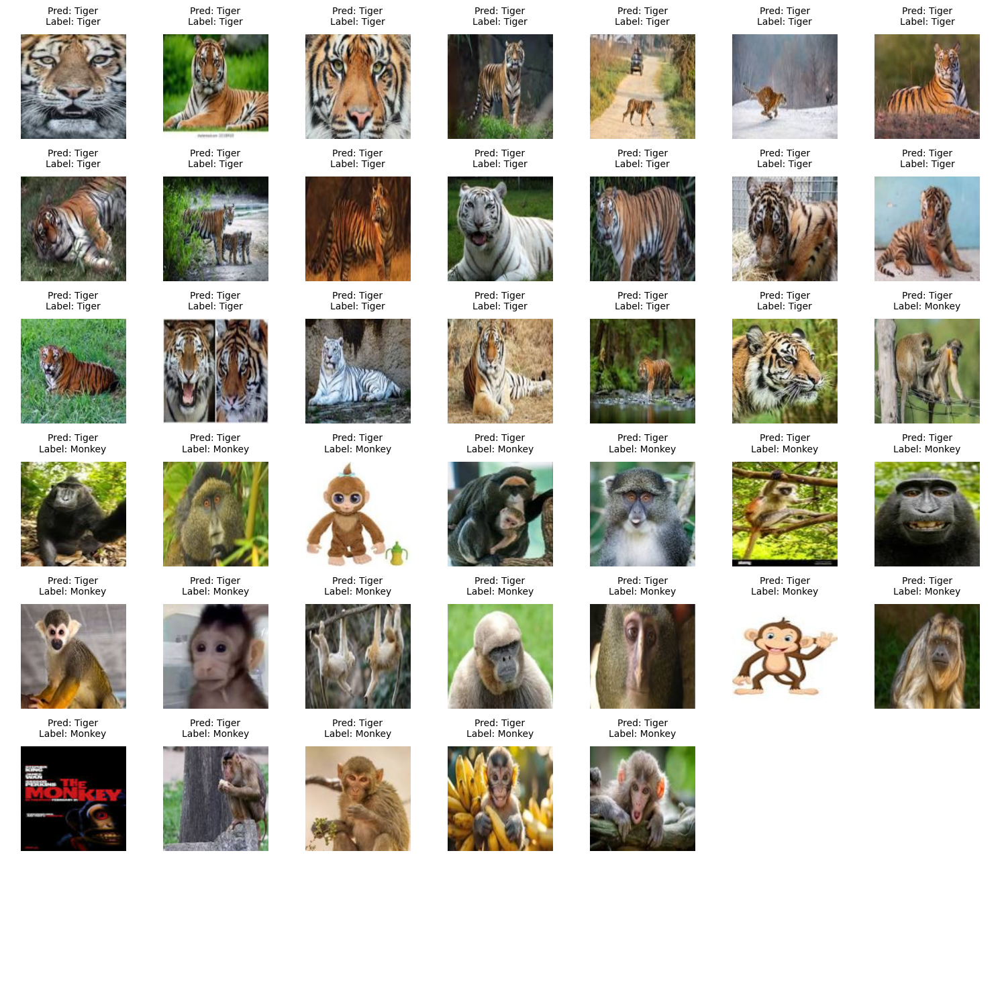

In [17]:
import matplotlib.pyplot as plt

# Ensure the model is in evaluation mode
model.eval()

# Initialize lists to store test images, predictions, and true labels
test_images = []
test_predictions = []
test_targets = []

# Disable gradient computation for inference
with torch.no_grad():
    for data, target in test_loader:
        # Convert string labels to numeric if necessary
        if isinstance(target, str):
            target = class_to_idx[target]
        elif isinstance(target, tuple) and isinstance(target[0], str):
            target = class_to_idx[target[0]]

        target = torch.tensor(target, dtype=torch.float, device=device).view(-1, 1)
        data = data.to(device)

        outputs = model(data)
        predicted = (outputs > 0.5).float()

        # Store the images, predictions, and targets
        test_images.extend(data.cpu())  # Add each image in the batch
        test_predictions.extend(predicted.cpu().numpy())  # Convert to numpy for easier processing
        test_targets.extend(target.cpu().numpy())  # Convert to numpy for easier processing

import math
import matplotlib.pyplot as plt




# Visualization setup
num_images = len(test_images)
grid_size = math.ceil(math.sqrt(num_images))  # Determine grid size dynamically
fig, axs = plt.subplots(grid_size, grid_size, figsize=(15, 15))  # Dynamic grid
axs = axs.flatten()  # Flatten to iterate easily over axes

for i, ax in enumerate(axs):
    if i >= num_images:
        ax.axis('off')  # Hide unused subplots
        continue

    img = test_images[i]
    pred = test_predictions[i]
    label = test_targets[i]

    # Revert normalization (if applied) and transform tensor to image
    img = img.permute(1, 2, 0).numpy()  # Convert from (C, H, W) to (H, W, C)
    img = (img - img.min()) / (img.max() - img.min())  # Rescale for visibility

    # Display the image with predictions and labels
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(f"Pred: {'Monkey' if pred == 0 else 'Tiger'}\nLabel: {'Monkey' if label == 0 else 'Tiger'}",
                 fontsize=10, pad=10)  # Add padding between the image and the title

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.5, hspace=0.7)  # Add horizontal and vertical spacing
plt.tight_layout()
plt.show()

Prediction for Class_A_easy: Class B


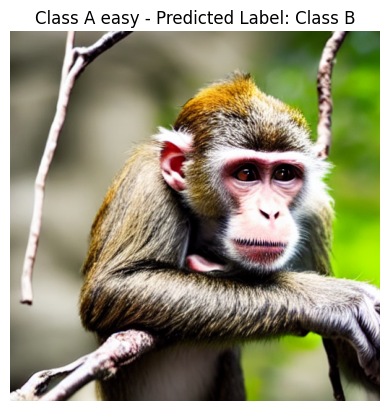

Prediction for Class_A_hard: Class B


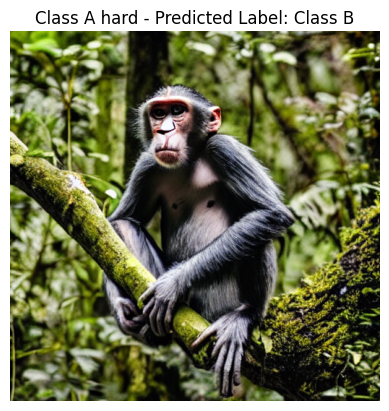

Prediction for Class_B_easy: Class B


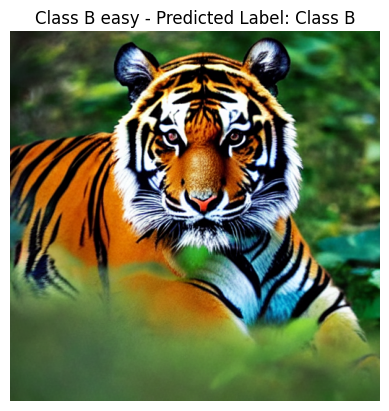

Prediction for Class_B_hard: Class B


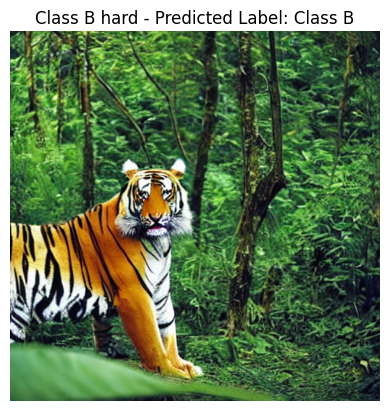

In [18]:
from PIL import Image
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# Define image transformations (resize and convert to tensor)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model's expected input size
    transforms.ToTensor(),
])

# List of image paths and labels for each of the generated images
image_paths = {
    "Class_A_easy": "/content/generated_Class_A_easy.png",
    "Class_A_hard": "/content/generated_Class_A_hard.png",
    "Class_B_easy": "/content/generated_Class_B_easy.png",
    "Class_B_hard": "/content/generated_Class_B_hard.png",
}

# Initialize model for evaluation
model.eval()

# Loop through each generated image, process, predict, and display results
for label, path in image_paths.items():
    # Load and preprocess the image
    image = Image.open(path).convert("RGB")  # Ensure it's in RGB mode
    image = transform(image).unsqueeze(0)  # Add batch dimension
    image = image.to(device)  # Move to the same device as the model (e.g., CUDA)

    # Make prediction
    with torch.no_grad():
        output = model(image)
        prediction = (output > 0.5).float()  # Apply threshold for binary classification

    # Convert prediction to label
    predicted_label = "Class A" if prediction.item() == 0 else "Class B"
    print(f"Prediction for {label}: {predicted_label}")

    # Display the image with the predicted label
    plt.imshow(Image.open(path))
    plt.axis("off")
    plt.title(f"{label.replace('_', ' ')} - Predicted Label: {predicted_label}")
    plt.show()
